# 🚲 Santander Cycling dataset 

![Dall-e prompt: "A data scientist juggling a laptop with a Santander cycle"](../images/img1.png)


As an avid runner and cyclist who has lived in London for the past decade, I am naturally drawn to the wealth of cycling data provided by [Transport for London](https://tfl.gov.uk/info-for/open-data-users/our-open-data), including the data for all [Santander Cycle Hire journeys since September 2015]( cycling.data.tfl.gov.uk) (many of which are journeys made by me!).

These data are provided in multiple formats across a few different time periods, but handily Google Cloud have provided a hosted version on their Big Query platform, which can be accessed through the [Google Cloud Marketplace](https://console.cloud.google.com/marketplace/product/greater-london-authority/london-bicycles).

In this notebook, we'll have a look at the data across the two tables provided:

- `hire` which contains detailed journey data including rental ids, duration, bike ids, start and end stations, and timestamps.
- `stations` which includes information about each bike hire station such as location, number of docks, and installation dates.


In [1]:
import contextily as cx
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from google.cloud import bigquery

import os

os.chdir("..")


# 📊 Loading Data
# 


First, let's take a quick look at the size of the data

In [2]:
client = bigquery.Client()

_res_hire = (
    client.query(
        "SELECT COUNT(*) AS n from `bigquery-public-data.london_bicycles.cycle_hire`"
    )
    .to_dataframe()["n"]
    .item()
)
print(f"Number of trips: {int(_res_hire):,}")

_res_stations = (
    client.query(
        "SELECT COUNT(*) AS n from `bigquery-public-data.london_bicycles.cycle_stations`"
    )
    .to_dataframe()["n"]
    .item()
)
print(f"Number of stations: {int(_res_stations):,}")


Number of trips: 83,434,866
Number of stations: 798


Given these table sizes, it's a too big to bring the whole `hire` dataset into memory (at least for the laptop I'm developing on!).
We'll create a couple of cuts of the `hire` data:

- `hire_2022-01-01_2022-12-31.parquet` - a sample of the data with journeys that started in the calendar year 2022
- `hourly_hire_counts_<dt_from>_<dt_to>.parquet` - Hourly counts of the dataset across a wider timeframe.

The scripts to create these datasets are contained in the `src/data/ingest.py` script in this repository

In [3]:
!python src/data/ingest.py

Data fetched and saved successfully!
Hourly hire counts with date fetched and saved successfully!


In [5]:
hire = pd.read_parquet("data/hire_2022-01-01_2022-12-31.parquet")
stations = pd.read_parquet("data/stations.parquet")

# 🌍 Geographic Visualization of Stations

We'll use [GeoPandas](https://geopandas.org/en/stable/getting_started/introduction.html) and [Contextily](https://contextily.readthedocs.io/en/latest/intro_guide.html) to generate a few plots. 





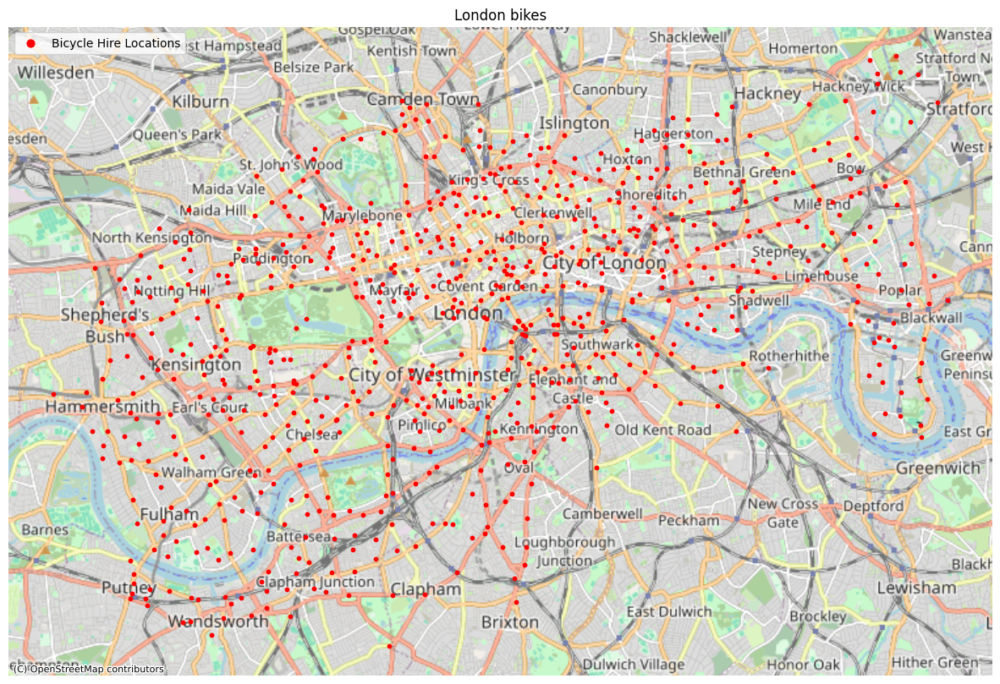

In [7]:
stations_gdf = gpd.GeoDataFrame(
    stations,
    geometry=gpd.points_from_xy(stations.longitude, stations.latitude),
    crs="EPSG:4326",
)  # type: ignore

stations_gdf = stations_gdf.to_crs(epsg=3857)

fig, ax = plt.subplots(figsize=(15, 15))
ax = stations_gdf.plot(alpha=1, markersize=10, ax=ax, c="red")
cx.add_basemap(
    ax, crs=stations_gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik
)

ax.axis("off")
ax.set_title("London bikes")
legend = ax.legend(["Bicycle Hire Locations"], loc="upper left", markerscale=2)

plt.show()

Lots of stations (798) around London, with a higher density in the centre.
Let's create some average metrics from the hire dataset to understand different station usage.

In [8]:
hire["start_hour"] = hire["start_date"].dt.hour
hire["end_hour"] = hire["end_date"].dt.hour
hire["ride_length"] = hire["duration"]

average_metrics = (
    hire.groupby("start_station_name")
    .agg({"start_hour": "mean", "end_hour": "mean", "ride_length": "mean"})
    .rename(
        columns={
            "start_hour": "avg_start_hour",
            "end_hour": "avg_end_hour",
            "ride_length": "avg_ride_length",
        }
    )
)

stations_gdf = stations_gdf.merge(
    average_metrics, left_on="name", right_index=True, how="left"
)

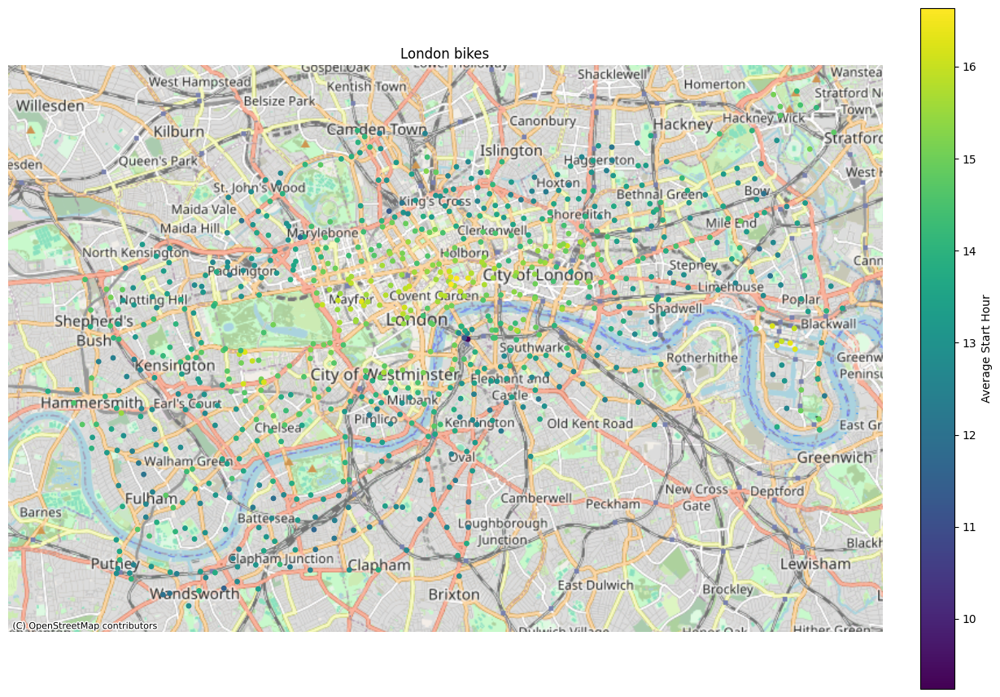

In [9]:
fig, ax = plt.subplots(figsize=(15, 15)) 
ax = stations_gdf.plot(
    column="avg_start_hour", alpha=1, markersize=15, ax=ax, cmap="viridis"
)  # Colour the points by the 'avg_start_hour'
cx.add_basemap(
    ax, crs=stations_gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik
)

sm = plt.cm.ScalarMappable(
    cmap="viridis",
    norm=plt.Normalize(
        vmin=stations_gdf["avg_start_hour"].min(),
        vmax=stations_gdf["avg_start_hour"].max(),
    ),
)
sm._A = []  # Create an empty array for the data range
fig.colorbar(
    sm,
    ax=ax,
    orientation="vertical",
    fraction=0.036,
    pad=0.04,
    label="Average Start Hour",
)

ax.axis("off")
ax.set_title("London bikes")

plt.show()

The data reveals a clear trend consistent with expected commuter behavior: further out stations stations tend to have an earlier average start time: commuters are likely to begin their journeys in the morning

> TODO: Create a measure of centrality for stations: a distance from a chosen centre. 



# 🚲 Trips

Let's have a look at the trips data


In [35]:
station_count = 798
unique_trips = hire.groupby(["start_station_name", "end_station_name"]).size()
unique_trips_count = unique_trips.shape[0]
unique_trips_count = (unique_trips == 1).sum()
unique_trip_perc = 100*unique_trips_count/station_count**2

print(f"Number of possible unique trips across {station_count} stations: {station_count**2:,}")
print(f"Number of unique trips we saw in 2022: {unique_trips_count:,} ({unique_trip_perc:.0f}% of all possible trips taken)")


Number of possible unique trips across 798 stations: 636,804
Number of unique trips we saw in 2022: 439,888 (69%)


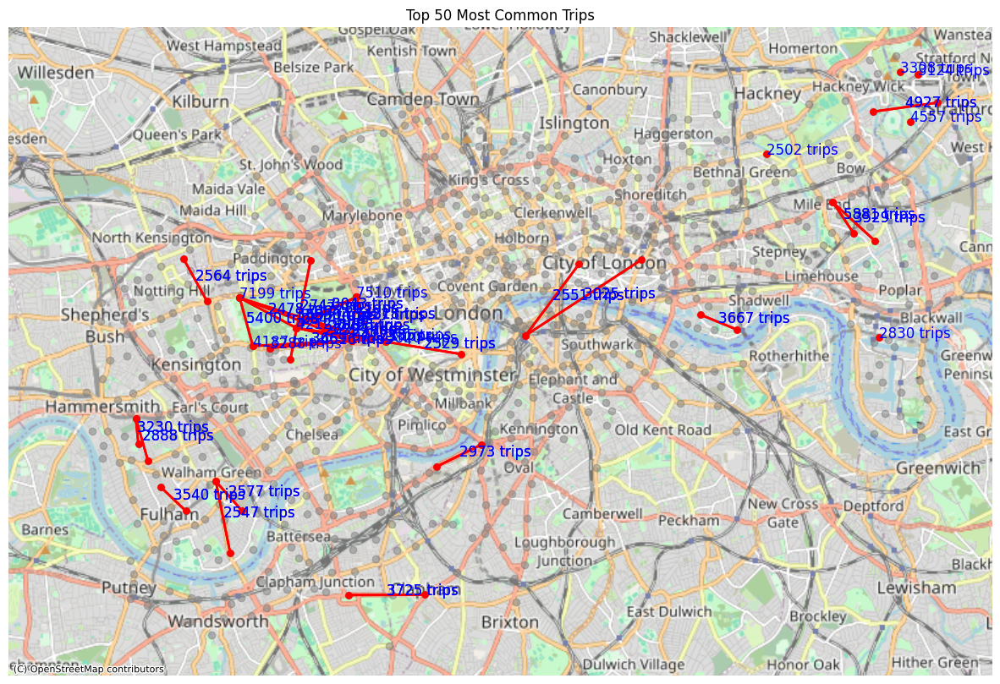

In [37]:
most_common_trips = (
    hire.groupby(["start_station_name", "end_station_name"])
    .size()
    .reset_index(name="count")
)
most_common_trips["station_pair"] = most_common_trips.apply(
    lambda x: tuple(sorted([x["start_station_name"], x["end_station_name"]])), axis=1
)
aggregated_trips = (
    most_common_trips.groupby("station_pair")["count"].sum().nlargest(50).reset_index()
)
aggregated_trips = aggregated_trips.merge(
    most_common_trips.drop("count", axis=1), on="station_pair"
)
fig, ax = plt.subplots(figsize=(15, 15))
stations_gdf.plot(ax=ax, color="gray", alpha=0.5)  # Plot all stations for context
for i, row in aggregated_trips.iterrows():
    # Extract the start and end stations for each trip
    start_station = stations_gdf[stations_gdf["name"] == row["start_station_name"]]
    end_station = stations_gdf[stations_gdf["name"] == row["end_station_name"]]
    # Check if start_station and end_station are not empty to avoid IndexError
    if not start_station.empty and not end_station.empty:
        # Plot a line between the start and end stations
        ax.plot(
            [start_station.geometry.x.values[0], end_station.geometry.x.values[0]],
            [start_station.geometry.y.values[0], end_station.geometry.y.values[0]],
            marker="o",
            color="red",
            linewidth=2,
            markersize=5,
        )
        # Annotate the line with the trip count
        mid_point = [
            (start_station.geometry.x.values[0] + end_station.geometry.x.values[0]) / 2,
            (start_station.geometry.y.values[0] + end_station.geometry.y.values[0]) / 2,
        ]
        ax.text(
            mid_point[0],
            mid_point[1],
            f"{row['count']} trips",
            color="blue",
            fontsize=12,
        )
cx.add_basemap(
    ax, crs=stations_gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik
)
ax.axis("off")
ax.set_title("Top 50 Most Common Trips")
plt.show()

> The top trips are mostly centred around Hyde park and Buckingham Palace: tourist trips most common?

> TODO: Further analyses needed


## 🏆 The bicycle visiting the most stations in 2022


In [39]:
most_unique_stations = hire.groupby("bike_id")["start_station_name"].nunique()
total_trips_by_bike = hire.groupby("bike_id").size()
bike_with_most_unique_starts = most_unique_stations.idxmax()
number_of_unique_stations = most_unique_stations.max()
total_trips_for_bike = total_trips_by_bike[bike_with_most_unique_starts]
print(
    f"Bike with the most unique start stations: ID{bike_with_most_unique_starts} ({number_of_unique_stations}/798 stations, {total_trips_for_bike} trips)"
)


Bike with the most unique start stations: ID21179 (630/798 stations, 1505 trips)


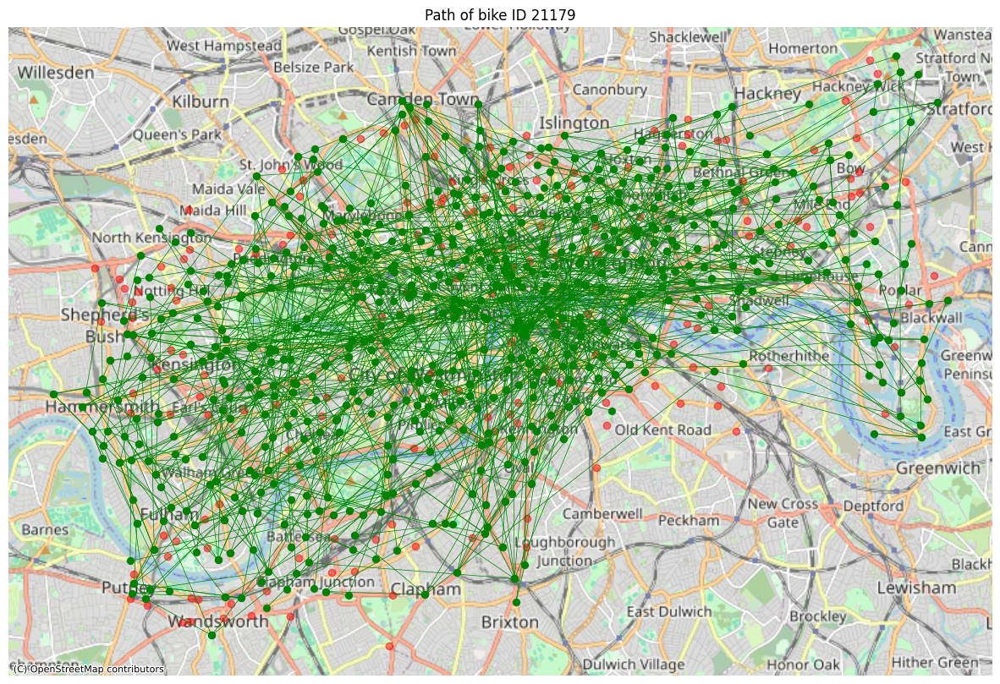

In [40]:
def plot_bike_path(bike_id, hire_data, stations_gdf):
    bike_trips = hire_data[hire_data["bike_id"] == bike_id]
    visited_stations = set(bike_trips["start_station_name"].unique()).union(
        set(bike_trips["end_station_name"].unique())
    )
    _, ax = plt.subplots(figsize=(15, 15))
    # Plot all stations not visited by this bike in red
    stations_gdf[~stations_gdf["name"].isin(visited_stations)].plot(
        ax=ax, color="red", alpha=0.5
    )
    # Plot all stations visited by this bike in green
    stations_gdf[stations_gdf["name"].isin(visited_stations)].plot(
        ax=ax, color="green", alpha=0.5
    )
    for _, trip in bike_trips.iterrows():
        start_station = stations_gdf[stations_gdf["name"] == trip["start_station_name"]]
        end_station = stations_gdf[stations_gdf["name"] == trip["end_station_name"]]
        if not start_station.empty and not end_station.empty:
            ax.plot(
                [start_station.geometry.x.values[0], end_station.geometry.x.values[0]],
                [start_station.geometry.y.values[0], end_station.geometry.y.values[0]],
                marker="o",
                color="green",
                linewidth=0.5,
                markersize=5,
            )
    cx.add_basemap(
        ax, crs=stations_gdf.crs.to_string(), source=cx.providers.OpenStreetMap.Mapnik
    )
    ax.axis("off")
    ax.set_title(f"Path of bike ID {bike_id}")
    plt.show()


plot_bike_path(21179, hire, stations_gdf)


This bike really got around London in 2022!

A mere mortal, for comparison:

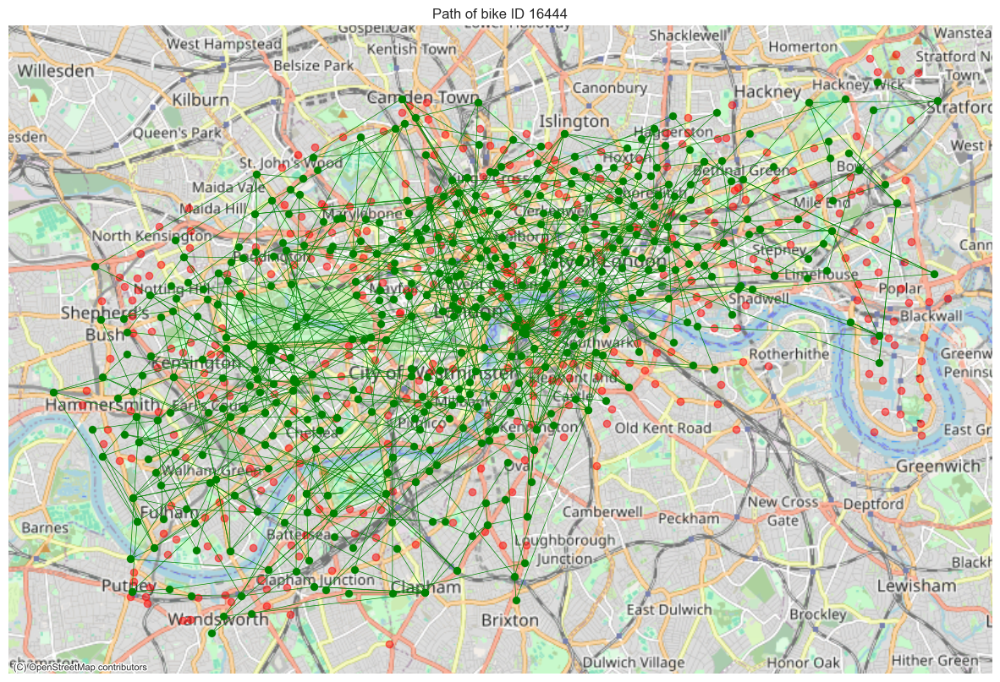

In [66]:
plot_bike_path(hire.bike_id.sample(1).item(), hire, stations_gdf)

Still got around a lot!

## ⏲️ Ride start times & durations


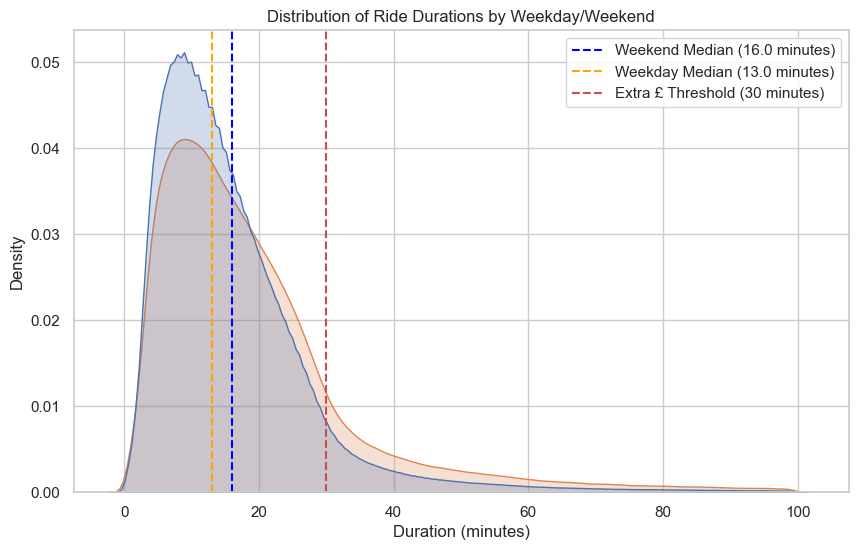

In [74]:
sns.set_theme(style="whitegrid")

hire["duration_minutes"] = hire["duration"] / 60
hire["day_type"] = (
    hire["end_date"]
    .dt.day_name()
    .apply(lambda x: "Weekend" if x in ["Saturday", "Sunday"] else "Weekday")
)

plt.figure(figsize=(10, 6))
sns.kdeplot(
    data=hire[hire["duration_minutes"] < 100],
    x="duration_minutes",
    hue="day_type",
    fill=True,
    common_norm=False,
)
# Calculate median and IQR for each day type
weekend_median = hire[hire["day_type"] == "Weekend"]["duration_minutes"].median()
weekday_median = hire[hire["day_type"] == "Weekday"]["duration_minutes"].median()

# Add median lines to the plot
plt.axvline(
    x=weekend_median,
    color="blue",
    linestyle="--",
    label="Weekend Median ({} minutes)".format(round(weekend_median, 2)),
)
plt.axvline(
    x=weekday_median,
    color="orange",
    linestyle="--",
    label="Weekday Median ({} minutes)".format(round(weekday_median, 2)),
)

plt.axvline(x=30, color="r", linestyle="--", label="Extra £ Threshold (30 minutes)")
plt.xlabel("Duration (minutes)")
plt.ylabel("Density")
plt.title("Distribution of Ride Durations by Weekday/Weekend")
plt.legend()
plt.show();

In [81]:
hire.groupby("day_type").duration_minutes.apply(lambda x: (x > 30).mean())

day_type
Weekday    0.089625
Weekend    0.164357
Name: duration_minutes, dtype: float64

> Weekday riders are shorter on average, fewer of them crossing the 30 minute threshold where an additional payment is taken for an additional 30 minutes ride (https://tfl.gov.uk/modes/cycling/santander-cycles/what-you-pay).
Weekday riders / commuters perhaps have a better understanding of the payments, combined with a more relaxed, longer usage of the weekend riders / tourists.

## 📅 Seasonality


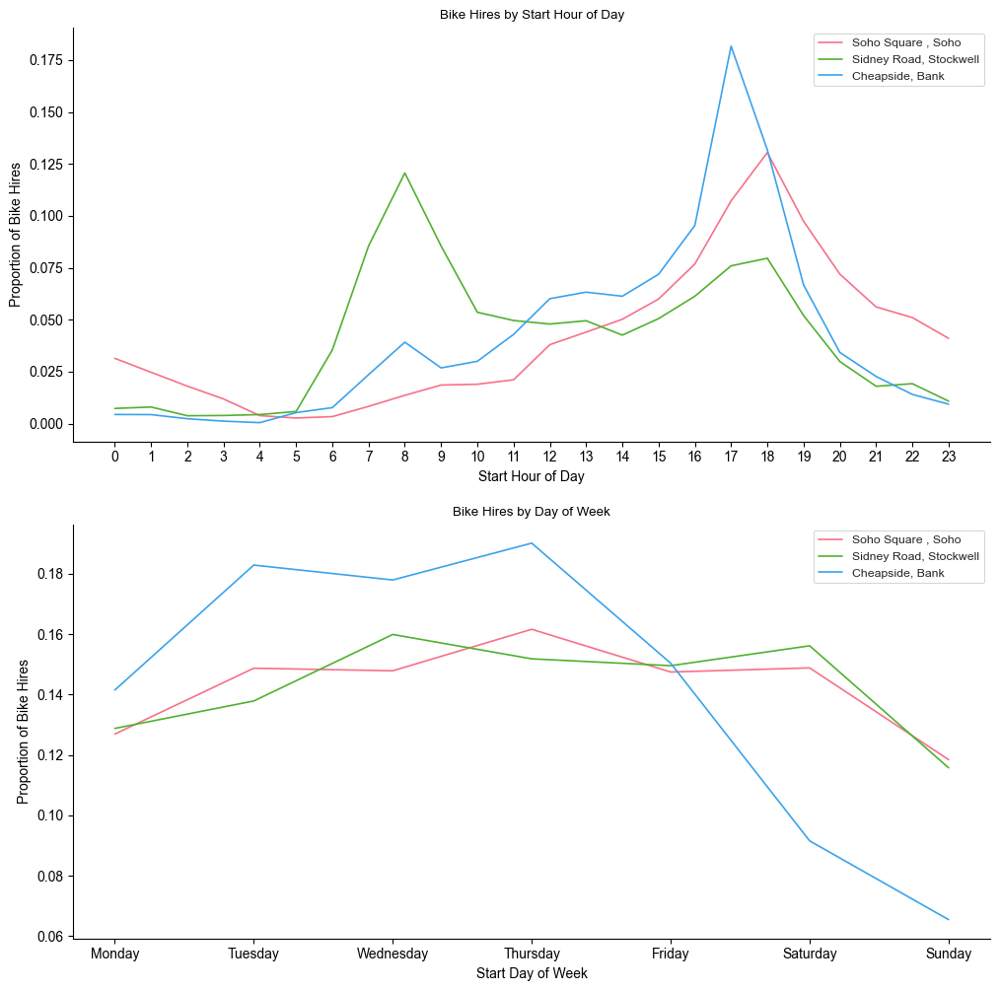

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt


def plot_bike_hires_by_station(station_names, hire):
    
    fig, (ax_hourly, ax_daily) = plt.subplots(2, 1, figsize=(12, 12), sharex=False)
    sns.set_theme(style="ticks")  # Changed to 'ticks' for minimalistic design
    sns.set_context("paper")
    palette = sns.color_palette("husl", len(station_names))

    for idx, station in enumerate(station_names):
        station_hire = hire.loc[hire["start_station_name"] == station].copy()
        station_hire["start_hour_of_day"] = station_hire["start_date"].dt.hour
        station_hire["start_day_of_week"] = station_hire["start_date"].dt.day_name()

        hourly_counts = station_hire.groupby("start_hour_of_day").size()
        hourly_counts = hourly_counts / hourly_counts.sum()

        daily_counts = (
            station_hire.groupby("start_day_of_week")
            .size()
            .reindex(
                [
                    "Monday",
                    "Tuesday",
                    "Wednesday",
                    "Thursday",
                    "Friday",
                    "Saturday",
                    "Sunday",
                ]
            )
        )

        daily_counts = daily_counts / daily_counts.sum()

        # Plotting the hourly bike hires for the current station
        sns.lineplot(
            ax=ax_hourly,
            x=hourly_counts.index,
            y=hourly_counts.values,
            label=station,
            color=palette[idx],
        )

        # Plotting the daily bike hires for the current station
        sns.lineplot(
            ax=ax_daily,
            x=daily_counts.index,
            y=daily_counts.values,
            label=station,
            color=palette[idx],
        )

    # Finalize the hourly hires plot
    ax_hourly.set_title("Bike Hires by Start Hour of Day")
    ax_hourly.set_xlabel("Start Hour of Day")
    ax_hourly.set_ylabel("Proportion of Bike Hires")
    ax_hourly.set_xticks(range(0, 24))
    ax_hourly.legend()

    # Finalize the daily hires plot
    ax_daily.set_title("Bike Hires by Day of Week")
    ax_daily.set_xlabel("Start Day of Week")
    ax_daily.set_ylabel("Proportion of Bike Hires")
    ax_daily.legend()

    sns.despine()
    plt.show()


# station_names = stations.name.sample(3).tolist()
station_names = ["Soho Square , Soho", "Sidney Road, Stockwell", "Cheapside, Bank"]
plot_bike_hires_by_station(station_names, hire)


- **Cheapside Bank**: expect this to be the most commuter-specific station, so much higher demand for journey starts on weekday evenings, exactly what we see.
- **Soho**: Nightlife galore - expect a higher demand at the weekend
- **Stockwell**: Not as central, mix of residential and bars / restaurants

> Could we create a clustering model to segment stations into a few logical groups?

## 🔮 What if I could predict when a bunch of cyclists would be at a location?
> We explore using a predictive model in the next notebook 


# 🚳 Not done:

Explored effects of:
- Bank holidays (added to dataset in feature engineering)
- School holidays
- Weather 
- Tube & train strikes